In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

In [3]:
df=pd.read_csv("temperature_data.csv")

In [4]:
df

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
998065,-0.047497,0.341638,0.331475,-1.246114,-1.222428,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725,72
998066,-0.048839,0.320022,0.331701,-1.250655,-1.222437,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279,72
998067,-0.042350,0.307415,0.330946,-1.246852,-1.222430,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666,72
998068,-0.039433,0.302082,0.330987,-1.249505,-1.222432,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581,72


# Exploratory Data Analysis and Visualizations

In [5]:
# Checking the information of dataset
df.info

<bound method DataFrame.info of          ambient   coolant       u_d       u_q  motor_speed    torque  \
0      -0.752143 -1.118446  0.327935 -1.297858    -1.222428 -0.250182   
1      -0.771263 -1.117021  0.329665 -1.297686    -1.222429 -0.249133   
2      -0.782892 -1.116681  0.332771 -1.301822    -1.222428 -0.249431   
3      -0.780935 -1.116764  0.333700 -1.301852    -1.222430 -0.248636   
4      -0.774043 -1.116775  0.335206 -1.303118    -1.222429 -0.248701   
...          ...       ...       ...       ...          ...       ...   
998065 -0.047497  0.341638  0.331475 -1.246114    -1.222428 -0.255640   
998066 -0.048839  0.320022  0.331701 -1.250655    -1.222437 -0.255640   
998067 -0.042350  0.307415  0.330946 -1.246852    -1.222430 -0.255640   
998068 -0.039433  0.302082  0.330987 -1.249505    -1.222432 -0.255640   
998069 -0.043803  0.312666  0.330830 -1.246590    -1.222431 -0.255640   

             i_d       i_q        pm  stator_yoke  stator_tooth  \
0       1.029572 -0.2458

In [6]:
# Checking the descriptive statistics of dataset
df.describe()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
count,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000
mean,-0.003905,0.004723,0.004780,-0.005690,-0.006336,-0.003333,0.006043,-0.003194,-0.004396,0.000609,-0.002208,-0.003935,50.732001
std,0.993127,1.002423,0.997878,1.002330,1.001229,0.997907,0.998994,0.997912,0.995686,1.001049,0.999597,0.998343,22.073125
min,-8.573954,-1.429349,-1.655373,-1.861463,-1.371529,-3.345953,-3.245874,-3.341639,-2.631991,-1.834688,-2.066143,-2.019973,4.000000
25%,-0.599385,-1.037925,-0.826359,-0.927390,-0.951892,-0.266917,-0.756296,-0.257269,-0.672308,-0.747265,-0.761951,-0.725622,32.000000
50%,0.266157,-0.177187,0.267542,-0.099818,-0.140246,-0.187246,0.213935,-0.190076,0.094367,-0.057226,0.005085,0.006536,56.000000
75%,0.686675,0.650709,0.358491,0.852625,0.853584,0.547171,1.013975,0.499260,0.680691,0.697344,0.772239,0.725660,68.000000
max,2.967117,2.649032,2.274734,1.793498,2.024164,3.016971,1.060937,2.914185,2.917456,2.449158,2.326668,2.653781,81.000000


In [7]:
# Checking null values
df.isna().sum()

ambient           0
coolant           0
u_d               0
u_q               0
motor_speed       0
torque            0
i_d               0
i_q               0
pm                0
stator_yoke       0
stator_tooth      0
stator_winding    0
profile_id        0
dtype: int64

In [8]:
# checking duplicated values
df[df.duplicated()]

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id


In [9]:
# Checking the shape of data
df.shape

(998070, 13)

In [10]:
# checking for datatypes
df.dtypes

ambient           float64
coolant           float64
u_d               float64
u_q               float64
motor_speed       float64
torque            float64
i_d               float64
i_q               float64
pm                float64
stator_yoke       float64
stator_tooth      float64
stator_winding    float64
profile_id          int64
dtype: object

In [11]:
# Checking the correlation between features
df.corr()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
ambient,1.000000,0.434435,0.194754,0.087430,0.078283,-0.262264,0.005605,-0.260562,0.501496,0.451616,0.396742,0.301883,0.384565
coolant,0.434435,1.000000,0.178708,0.027851,-0.033332,-0.189617,0.108489,-0.186060,0.430548,0.874037,0.689003,0.509298,0.499669
u_d,0.194754,0.178708,1.000000,-0.027472,-0.233828,-0.821325,0.358517,-0.796586,-0.082564,0.041428,-0.066256,-0.150714,0.300771
u_q,0.087430,0.027851,-0.027472,1.000000,0.716897,-0.037262,-0.181855,-0.026348,0.101236,0.106186,0.149017,0.125445,-0.122260
motor_speed,0.078283,-0.033332,-0.233828,0.716897,1.000000,0.024517,-0.722914,0.006323,0.332419,0.182564,0.333909,0.393154,-0.166225
torque,-0.262264,-0.189617,-0.821325,-0.037262,0.024517,1.000000,-0.239059,0.996560,-0.072905,-0.092207,-0.011055,0.080981,-0.257446
i_d,0.005605,0.108489,0.358517,-0.181855,-0.722914,-0.239059,1.000000,-0.204230,-0.299227,-0.179903,-0.387712,-0.539924,0.142368
i_q,-0.260562,-0.186060,-0.796586,-0.026348,0.006323,0.996560,-0.204230,1.000000,-0.086486,-0.098753,-0.025191,0.060949,-0.256127
pm,0.501496,0.430548,-0.082564,0.101236,0.332419,-0.072905,-0.299227,-0.086486,1.000000,0.695014,0.768352,0.729561,0.156735
stator_yoke,0.451616,0.874037,0.041428,0.106186,0.182564,-0.092207,-0.179903,-0.098753,0.695014,1.000000,0.949898,0.845144,0.398021


<AxesSubplot:>

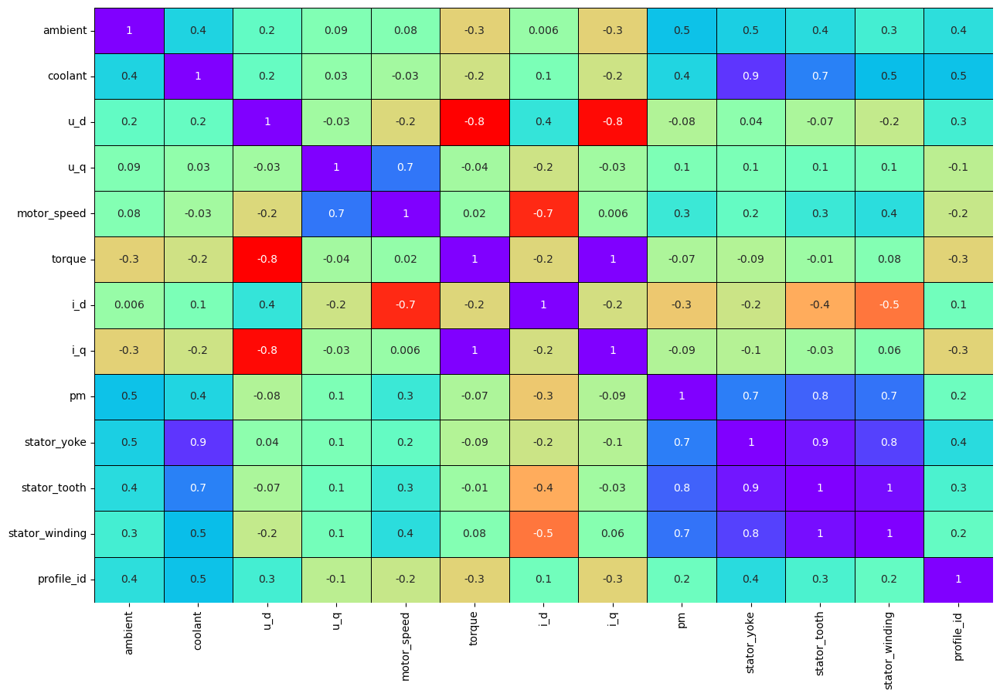

In [12]:
# Heatmap of correlation
fig,ax = plt.subplots(figsize = (15,10))
sns.heatmap(df.corr(),annot=True,fmt='.1g',cbar=False,linewidths='0.5',linecolor='black',cmap='rainbow_r')

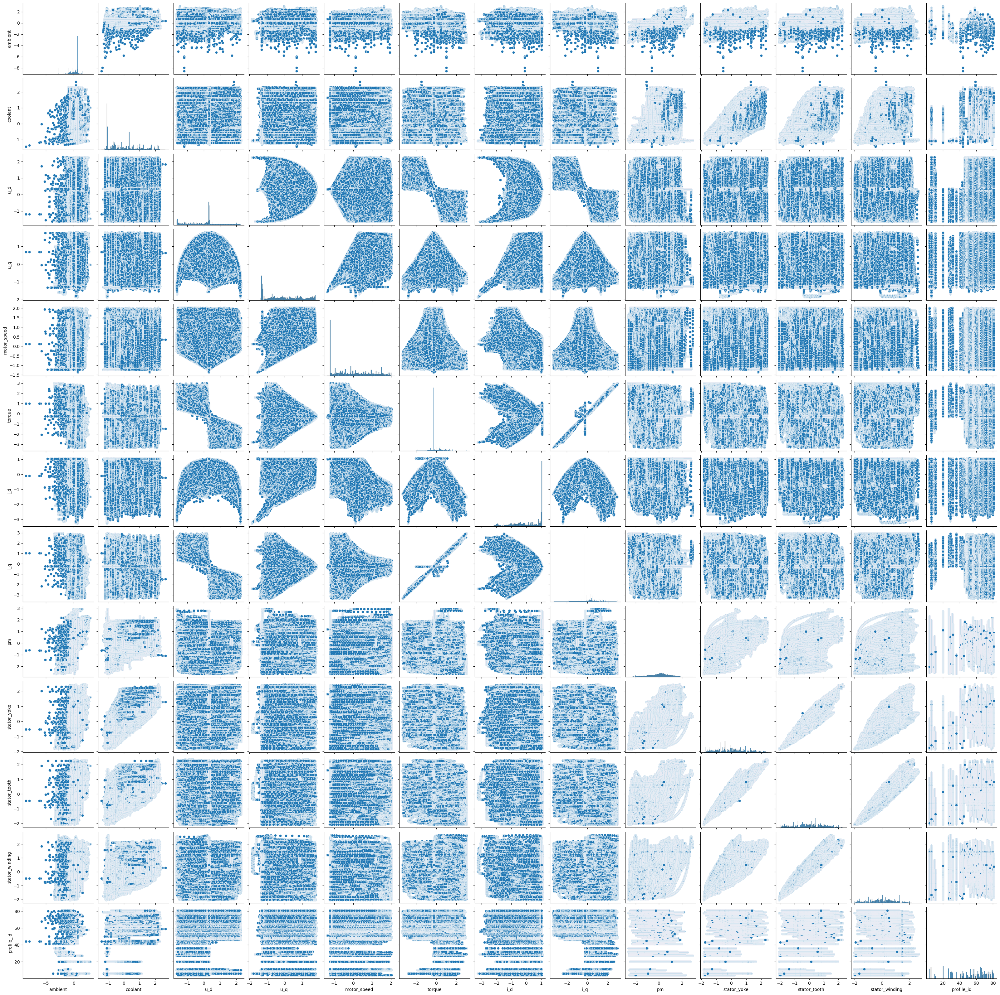

In [13]:
# Pairplot for checking the relaationships between features 
sns.pairplot(df)

ambient


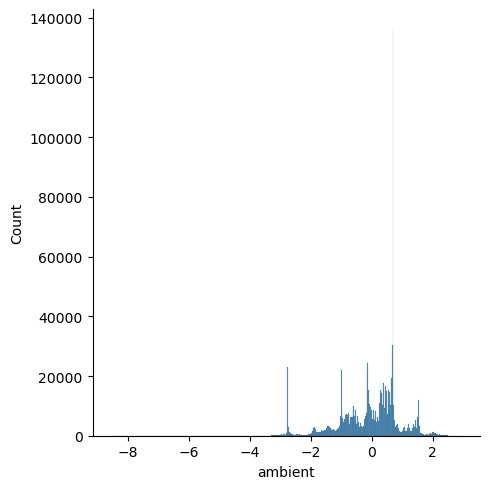

<Figure size 2000x1000 with 0 Axes>

coolant


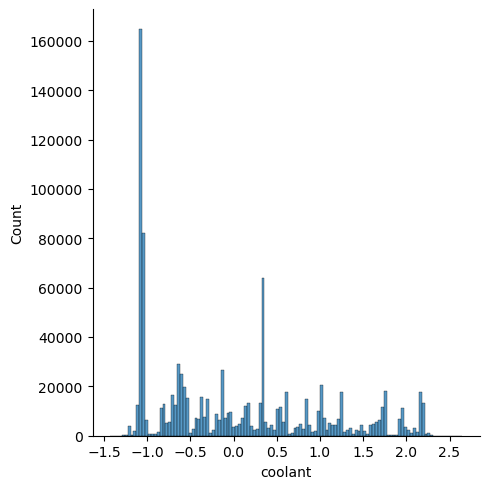

<Figure size 2000x1000 with 0 Axes>

u_d


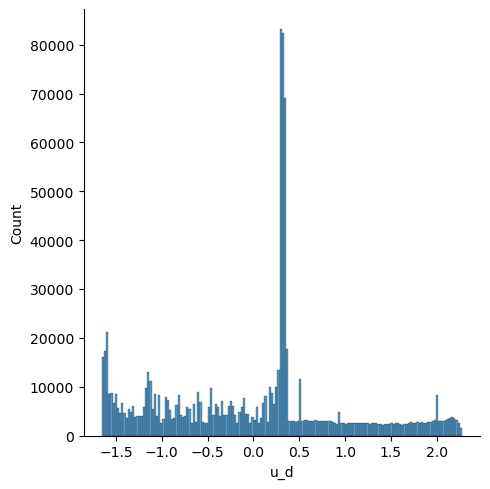

<Figure size 2000x1000 with 0 Axes>

u_q


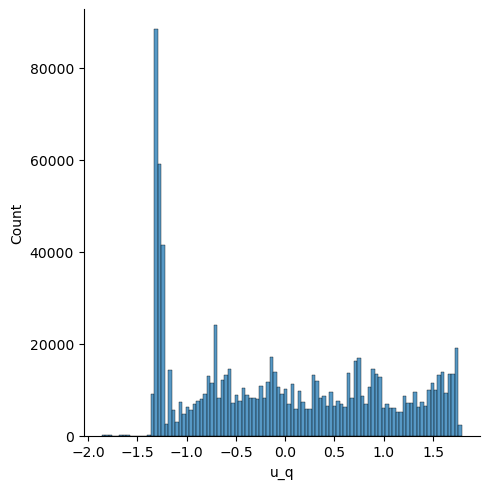

<Figure size 2000x1000 with 0 Axes>

motor_speed


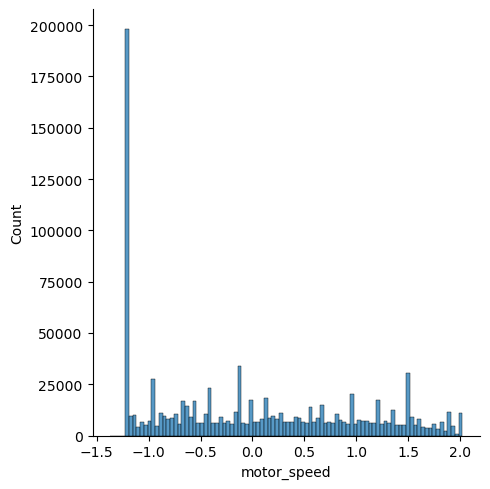

<Figure size 2000x1000 with 0 Axes>

torque


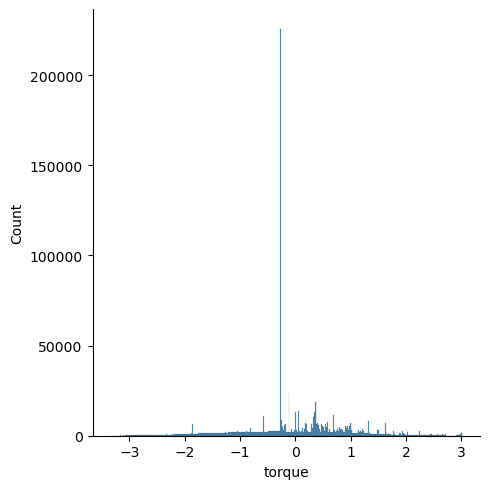

<Figure size 2000x1000 with 0 Axes>

i_d


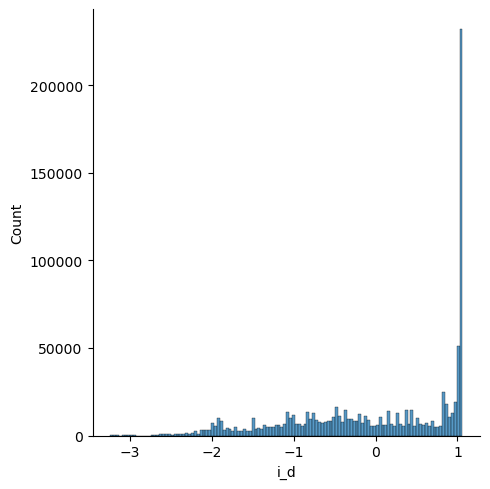

<Figure size 2000x1000 with 0 Axes>

i_q


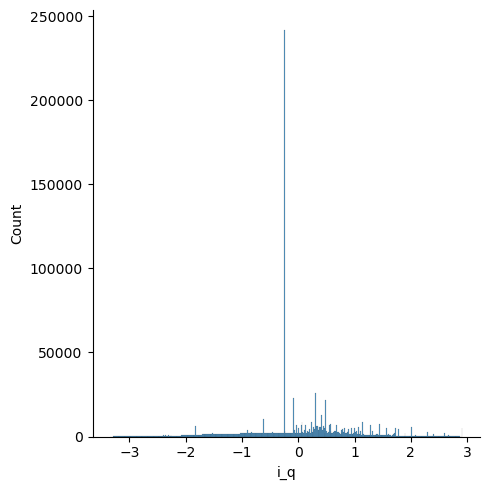

<Figure size 2000x1000 with 0 Axes>

pm


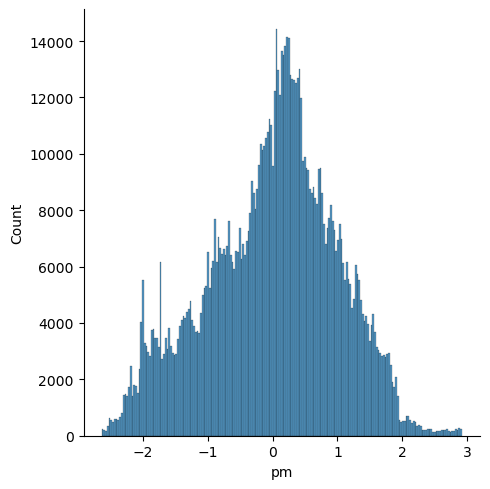

<Figure size 2000x1000 with 0 Axes>

stator_yoke


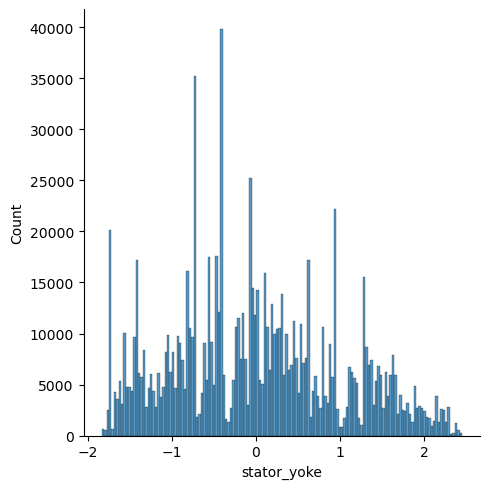

<Figure size 2000x1000 with 0 Axes>

stator_tooth


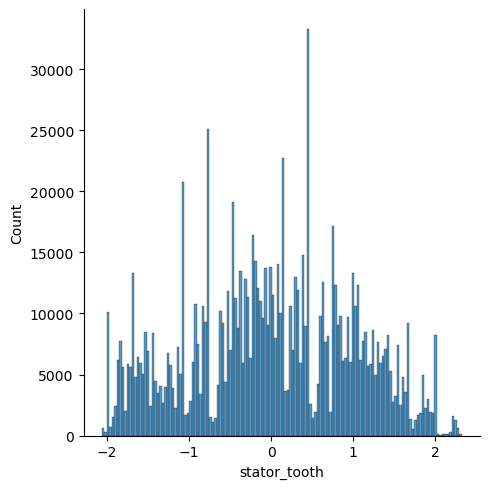

<Figure size 2000x1000 with 0 Axes>

stator_winding


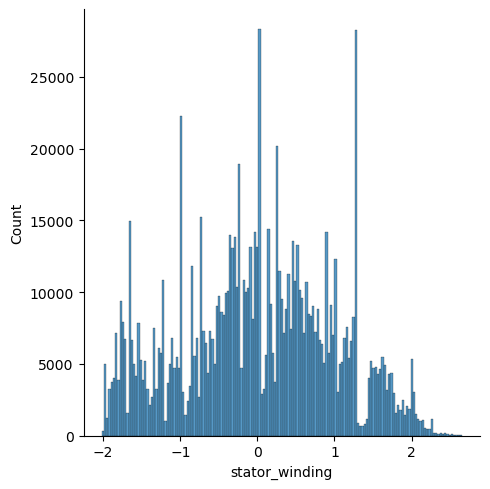

<Figure size 2000x1000 with 0 Axes>

profile_id


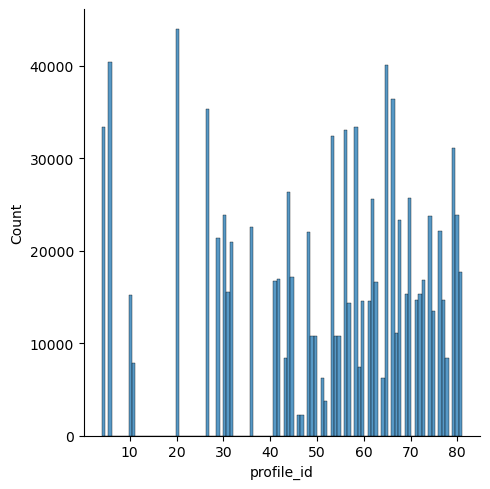

<Figure size 2000x1000 with 0 Axes>

In [14]:
#checking the skewness and analysing distribution of data
for n in df.columns:
    print(n)
    sns.displot(df[n])
    plt.figure(figsize=(20,10))
    plt.show()

<AxesSubplot:>

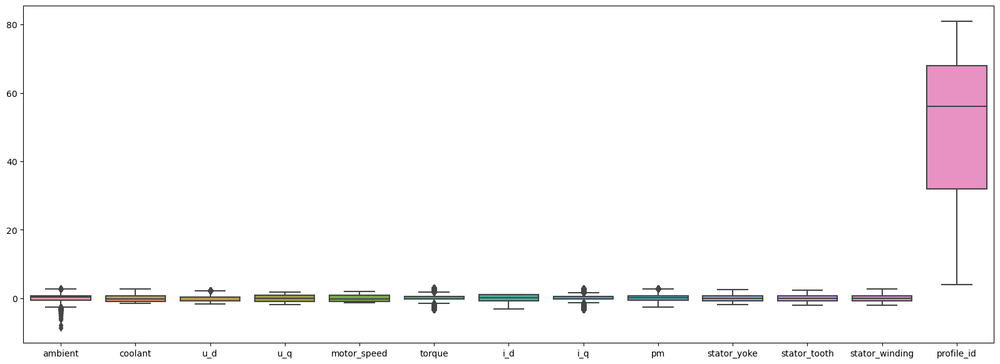

In [15]:
# Checking for any outliers 
plt.figure(figsize=(20,7))
sns.boxplot(data = df)

In [16]:
# Session counts of profile_id
print(f"Total Sessions : {len(df['profile_id'].unique())}")

Total Sessions : 52


In [17]:
print(f"Unique Sessions : {df['profile_id'].unique()}")

Unique Sessions : [ 4  6 10 11 20 27 29 30 31 32 36 41 42 43 44 45 46 47 48 49 50 51 52 53
 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 73 74 75 76 77 78
 79 80 81 72]


In [18]:
session_df = {'profile_id':[],'session_data_count':[]}
for i in df['profile_id'].unique():
    session_df['profile_id'].append(i)
    session_df['session_data_count'].append(len(df[df['profile_id']==i]))
session_df = pd.DataFrame(session_df)
session_df

,profile_id,session_data_count
0,4,33423
1,6,40387
2,10,15255
3,11,7886
4,20,43970
5,27,35360
6,29,21357
7,30,23862
8,31,15586
9,32,20959


<AxesSubplot:xlabel='profile_id', ylabel='motor_speed'>

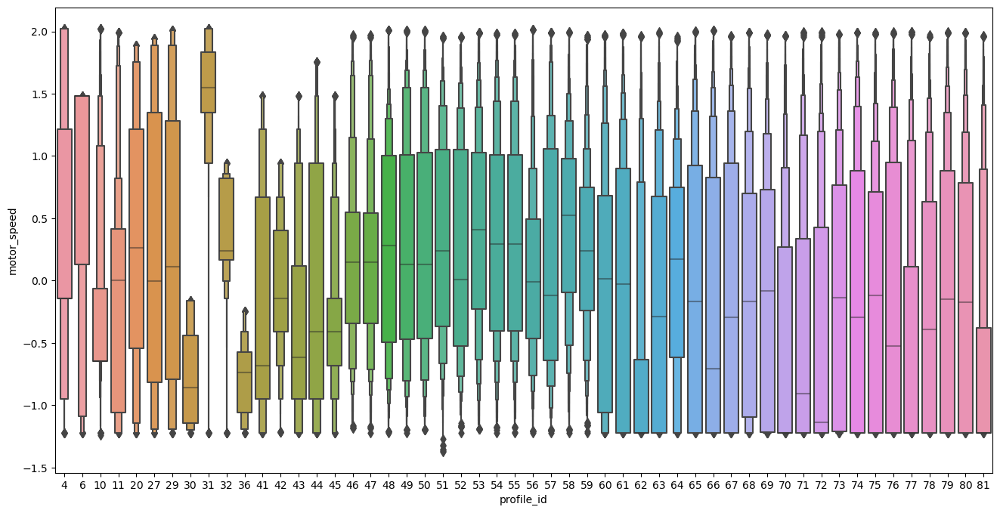

In [19]:
# Boxplot of motor speed for each unique session
plt.figure(figsize=(16,8))
sns.boxenplot(df.profile_id,df.motor_speed)

In [20]:
# here we drop the profile_id column
df1=df.drop(["profile_id"],axis=1)

In [21]:
df1.head()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145


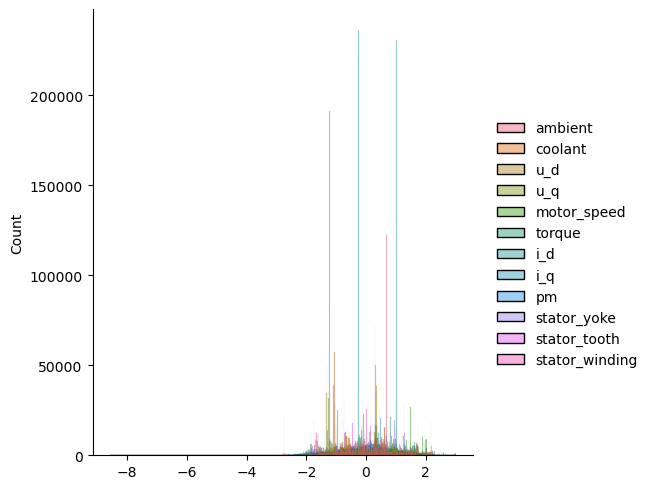

In [22]:
# Displot 
sns.displot(df1)

<AxesSubplot:>

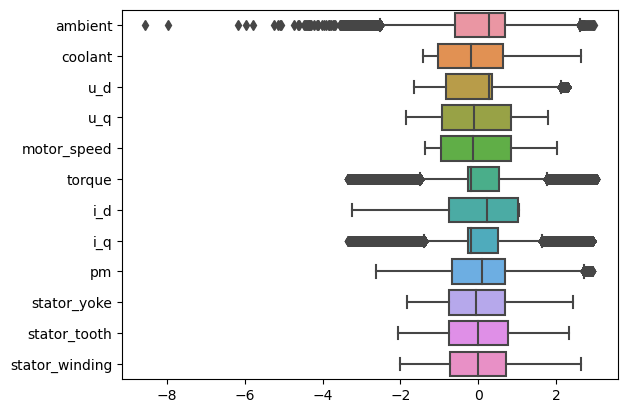

In [23]:
# Boxplot for checking the outliers
sns.boxplot(data = df1,orient='h')

In [24]:
# This is the function to find the outliers
def outliers(data,feature):
    Q1 = data[feature].quantile(0.25)
    Q3 = data[feature].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR
    
    ls= data.index[(data[feature] < lower_bound) | (data[feature]>upper_bound)]
    return ls

In [25]:
index_list = []
for feature in ['ambient','u_d','torque','i_q','pm']:
    index_list.extend(outliers(df1,feature))

In [26]:
index_list

[36414,
 36415,
 51062,
 51063,
 51064,
 51065,
 51066,
 51067,
 51758,
 51759,
 51760,
 51761,
 73810,
 73811,
 73812,
 73813,
 73814,
 73815,
 73816,
 73817,
 73818,
 73819,
 73820,
 73821,
 73822,
 73823,
 73824,
 73825,
 73826,
 73827,
 73828,
 73829,
 73830,
 73831,
 73832,
 73833,
 73834,
 73835,
 73836,
 73837,
 73838,
 73839,
 73840,
 73841,
 73842,
 73843,
 73844,
 73845,
 73846,
 73847,
 73848,
 73849,
 73850,
 73851,
 73852,
 73853,
 73854,
 73855,
 73856,
 73857,
 73858,
 73859,
 73860,
 73861,
 73862,
 73863,
 73864,
 73865,
 73866,
 73867,
 73868,
 73869,
 73870,
 73871,
 73872,
 73873,
 73874,
 73875,
 73876,
 73877,
 73878,
 73879,
 73880,
 73881,
 73882,
 73883,
 73884,
 73885,
 73886,
 73887,
 73888,
 73889,
 73890,
 73891,
 73892,
 73893,
 73894,
 73895,
 73896,
 73897,
 73898,
 73899,
 73900,
 73901,
 73902,
 73903,
 73904,
 73905,
 73906,
 73907,
 73908,
 73909,
 73910,
 73911,
 73912,
 73913,
 73914,
 73915,
 73916,
 73917,
 73918,
 73919,
 73920,
 73921,
 73922,


In [27]:
def remove(data,ls):
    ls = sorted(set(ls))
    data = data.drop(ls)
    return data

In [28]:
df2 = remove(df1,index_list)

In [29]:
df1.shape

(998070, 12)

In [30]:
df2.shape

(814996, 12)

<AxesSubplot:>

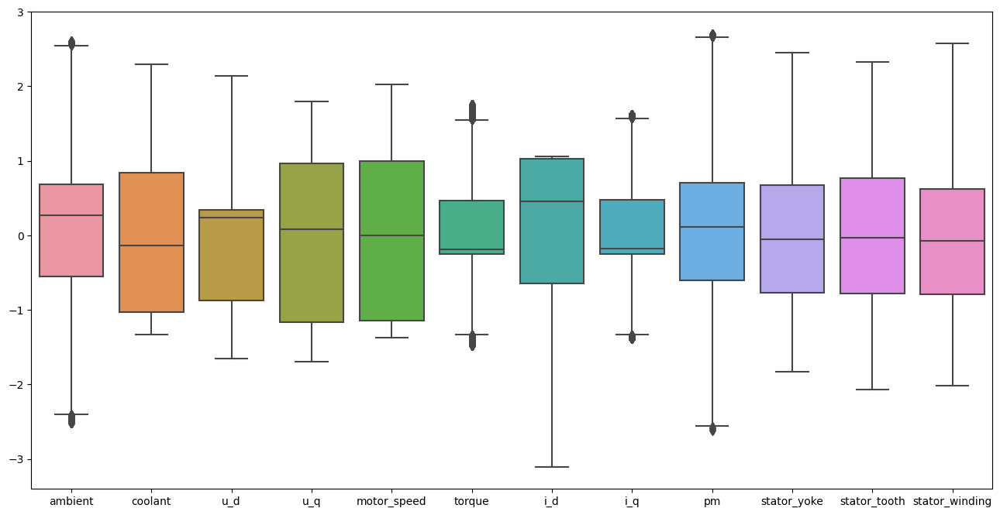

In [31]:
plt.figure(figsize=(16,8))
sns.boxplot(data = df2)

In [32]:
df2.corr()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
ambient,1.000000,0.399480,0.147875,0.070383,0.034122,-0.161160,0.016085,-0.162920,0.394973,0.415292,0.363603,0.290629
coolant,0.399480,1.000000,0.178951,0.013726,-0.056116,-0.179571,0.111160,-0.174933,0.388552,0.882587,0.702237,0.537764
u_d,0.147875,0.178951,1.000000,-0.012887,-0.309555,-0.886515,0.538459,-0.845703,-0.173839,-0.009800,-0.153375,-0.263108
u_q,0.070383,0.013726,-0.012887,1.000000,0.725273,-0.055580,-0.282381,-0.038319,0.091586,0.128812,0.198203,0.203841
motor_speed,0.034122,-0.056116,-0.309555,0.725273,1.000000,0.107290,-0.821602,0.070620,0.328285,0.196167,0.378149,0.475515
torque,-0.161160,-0.179571,-0.886515,-0.055580,0.107290,1.000000,-0.392887,0.992615,0.066255,-0.033613,0.075373,0.173067
i_d,0.016085,0.111160,0.538459,-0.282381,-0.821602,-0.392887,1.000000,-0.327846,-0.353362,-0.175287,-0.387453,-0.534230
i_q,-0.162920,-0.174933,-0.845703,-0.038319,0.070620,0.992615,-0.327846,1.000000,0.038836,-0.045427,0.050860,0.138921
pm,0.394973,0.388552,-0.173839,0.091586,0.328285,0.066255,-0.353362,0.038836,1.000000,0.680281,0.781660,0.783877
stator_yoke,0.415292,0.882587,-0.009800,0.128812,0.196167,-0.033613,-0.175287,-0.045427,0.680281,1.000000,0.950128,0.855460


<AxesSubplot:>

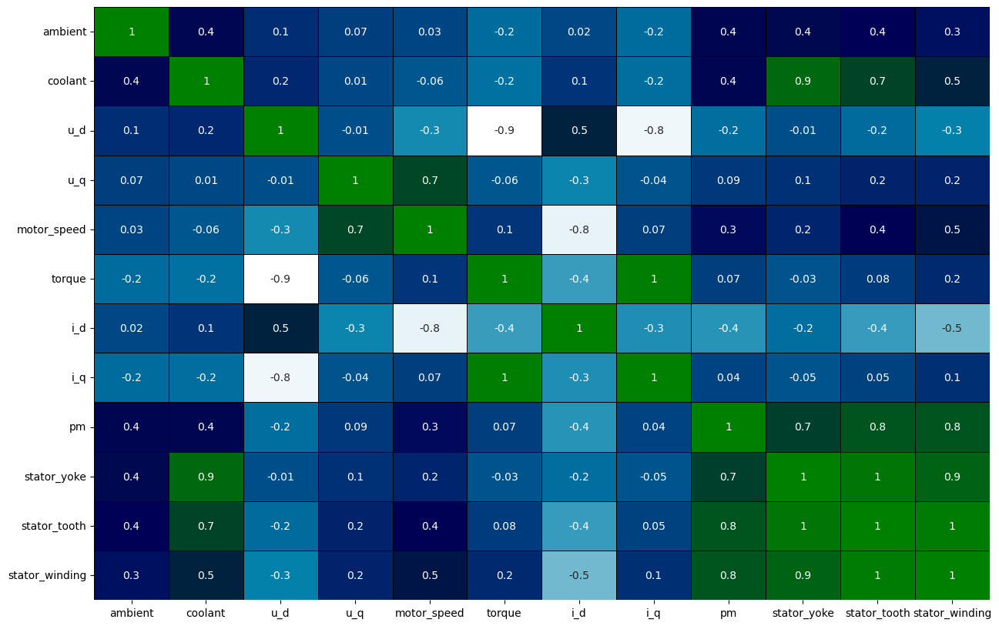

In [33]:
fig,ax = plt.subplots(figsize = (15,10))
sns.heatmap(df2.corr(),annot=True,fmt='.1g',cbar=False,linewidths='0.5',linecolor='black',cmap='ocean_r')

In [34]:
df3 = df2[[col for col in df2.columns if col != 'motor_speed'] + ['motor_speed']]

In [35]:
df3.head()

,ambient,coolant,u_d,u_q,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,motor_speed
0,-0.752143,-1.118446,0.327935,-1.297858,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,-1.222428
1,-0.771263,-1.117021,0.329665,-1.297686,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,-1.222429
2,-0.782892,-1.116681,0.332771,-1.301822,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,-1.222428
3,-0.780935,-1.116764,0.333700,-1.301852,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,-1.222430
4,-0.774043,-1.116775,0.335206,-1.303118,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,-1.222429


In [36]:
X = df3.iloc[: ,:-1]
Y = df3.iloc[:,-1]

In [37]:
X

,ambient,coolant,u_d,u_q,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
0,-0.752143,-1.118446,0.327935,-1.297858,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033
1,-0.771263,-1.117021,0.329665,-1.297686,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631
2,-0.782892,-1.116681,0.332771,-1.301822,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343
3,-0.780935,-1.116764,0.333700,-1.301852,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632
4,-0.774043,-1.116775,0.335206,-1.303118,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145
...,...,...,...,...,...,...,...,...,...,...,...
998065,-0.047497,0.341638,0.331475,-1.246114,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725
998066,-0.048839,0.320022,0.331701,-1.250655,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279
998067,-0.042350,0.307415,0.330946,-1.246852,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666
998068,-0.039433,0.302082,0.330987,-1.249505,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581


In [38]:
Y

0        -1.222428
1        -1.222429
2        -1.222428
3        -1.222430
4        -1.222429
            ...   
998065   -1.222428
998066   -1.222437
998067   -1.222430
998068   -1.222432
998069   -1.222431
Name: motor_speed, Length: 814996, dtype: float64

In [39]:
from sklearn.model_selection import train_test_split

In [40]:
x_train, x_test, y_train, y_test = train_test_split(X,Y,test_size=0.25,random_state=30)

(x_train.shape, y_train.shape,x_test.shape, y_test.shape)

((611247, 11), (611247,), (203749, 11), (203749,))

# Regularization

## 1.Ridge

In [41]:
# import ridge regression from sklearn library 
from sklearn.linear_model import Ridge 

# Train the model 
ridgeR = Ridge(alpha = 0.1)
ridgeR.fit(x_train, y_train) 
y_pred = ridgeR.predict(x_test) 

# calculate mean square error 
mean_squared_error_ridge = np.mean((y_pred - y_test)**2) 
print(mean_squared_error_ridge) 

# get ridge coefficient and print them 
ridge_coefficient = pd.DataFrame() 
ridge_coefficient["Columns"]= x_train.columns 
ridge_coefficient['Coefficient Estimate'] = pd.Series(ridgeR.coef_) 
ridge_coefficient

0.02438582669585196


,Columns,Coefficient Estimate
0,ambient,-0.020996
1,coolant,0.176570
2,u_d,-0.406928
3,u_q,0.466359
4,torque,-2.378367
5,i_d,-0.772693
6,i_q,1.635561
7,pm,0.058510
8,stator_yoke,-0.498121
9,stator_tooth,0.419534


## 2.Lasso

In [42]:
from sklearn.linear_model import Lasso 

# Train the model 
lasso = Lasso(alpha = 1) 
lasso.fit(x_train, y_train) 
y_pred1 = lasso.predict(x_test) 

# Calculate Mean Squared Error 
mean_squared_error = np.mean((y_pred1 - y_test)**2) 
print("Mean squared error on test set", mean_squared_error) 
lasso_coeff = pd.DataFrame() 
lasso_coeff["Columns"] = x_train.columns 
lasso_coeff['Coefficient Estimate'] = pd.Series(lasso.coef_) 

lasso_coeff

Mean squared error on test set 1.1122821451082288


,Columns,Coefficient Estimate
0,ambient,0.0
1,coolant,-0.0
2,u_d,-0.0
3,u_q,0.0
4,torque,0.0
5,i_d,-0.0
6,i_q,0.0
7,pm,0.0
8,stator_yoke,0.0
9,stator_tooth,0.0


## 3.Elasticnet

In [43]:
from sklearn.linear_model import ElasticNet 

# Train the model 
e_net = ElasticNet(alpha = 1,l1_ratio=0.5) 
e_net.fit(x_train, y_train) 

# calculate the prediction and mean square error 
y_pred_elastic = e_net.predict(x_test) 
mean_squared_error = np.mean((y_pred_elastic - y_test)**2) 
print("Mean Squared Error on test set", mean_squared_error) 

e_net_coeff = pd.DataFrame() 
e_net_coeff["Columns"] = x_train.columns 
e_net_coeff['Coefficient Estimate'] = pd.Series(e_net.coef_) 
e_net_coeff

Mean Squared Error on test set 0.5857176078822747


,Columns,Coefficient Estimate
0,ambient,0.000000
1,coolant,-0.000000
2,u_d,-0.000000
3,u_q,0.154610
4,torque,0.000000
5,i_d,-0.213438
6,i_q,0.000000
7,pm,0.000000
8,stator_yoke,0.000000
9,stator_tooth,0.000000


# Calculating VIF

In [44]:
import statsmodels.formula.api as smf

In [45]:
df4 = df3[['u_d','u_q','motor_speed','torque','i_q','i_d','pm','stator_yoke','stator_tooth','stator_winding']]

In [46]:
# Residual Scores for all models with one feature
rsq_ud = smf.ols('u_d~u_q+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=df4).fit().rsquared
vif_ud = 1/(1-rsq_ud)

rsq_uq = smf.ols('u_q~u_d+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=df4).fit().rsquared
vif_uq = 1/(1-rsq_uq)

rsq_torque = smf.ols('torque~u_q+u_d+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=df4).fit().rsquared
vif_torque = 1/(1-rsq_torque)

rsq_iq = smf.ols('i_q~u_q+torque+u_d+i_d+pm+stator_yoke+stator_tooth+stator_winding',data=df4).fit().rsquared
vif_iq = 1/(1-rsq_iq)

rsq_id = smf.ols('i_d~u_q+torque+u_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=df4).fit().rsquared
vif_id = 1/(1-rsq_id)

rsq_pm = smf.ols('pm~u_q+torque+u_d+i_q+i_d+stator_yoke+stator_tooth+stator_winding',data=df4).fit().rsquared
vif_pm = 1/(1-rsq_pm)

rsq_stator_yoke = smf.ols('stator_yoke~u_q+torque+u_d+i_q+pm+i_d+stator_tooth+stator_winding',data=df4).fit().rsquared
vif_stator_yoke = 1/(1-rsq_stator_yoke)

rsq_stator_tooth = smf.ols('stator_tooth~u_q+torque+u_d+i_q+pm+i_d+stator_yoke+stator_winding',data=df4).fit().rsquared
vif_stator_tooth = 1/(1-rsq_stator_tooth)

rsq_stator_winding = smf.ols('stator_winding~u_q+torque+u_d+i_q+pm+i_d+stator_tooth+stator_yoke',data=df4).fit().rsquared
vif_stator_winding = 1/(1-rsq_stator_winding)

In [47]:
# Creating a data frame for the VIF Scores

d1 = {"Features" : ['u_d','u_q','torque','i_q','i_d','pm','stator_yoke','stator_tooth','stator_winding'],"VIF Scores": [vif_ud,vif_uq,vif_torque,vif_iq,vif_id,vif_pm,vif_stator_yoke,vif_stator_tooth,vif_stator_winding]}
Vif_frame = pd.DataFrame(d1)
Vif_frame

,Features,VIF Scores
0,u_d,8.557179
1,u_q,1.774479
2,torque,216.265464
3,i_q,166.059762
4,i_d,3.754634
5,pm,3.619722
6,stator_yoke,102.839192
7,stator_tooth,528.202240
8,stator_winding,188.385537


In [48]:
from statsmodels.graphics.regressionplots import influence_plot
%matplotlib inline

In [49]:
df_reg = df4[['u_q','i_d','motor_speed']]
df_vif = df4[['u_q','u_d','i_d','pm','motor_speed']]

In [53]:
df_reg.to_csv('Regularization.csv',index=False)

In [55]:
df_vif.to_csv('VIF.csv',index=False)